<a href="https://colab.research.google.com/github/amen-hussain/SP25-Project/blob/main/diabetes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installing all needed libraries

In [ ]:
!pip install plotly==5.15.0

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra
import matplotlib.pyplot as plt  #graphs and plots
import seaborn as sns   #data visualizations
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction

from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching

# import various functions from sklearn
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

# Understanding the dataset

In [ ]:
diabetes = pd.read_csv('/content/diabetic_data.csv')

In [ ]:
# Seeing what it looks like
diabetes.head()

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO


Percentage of patient readmitted: 34.93% --> (35545 patients)

Percentage of patient not readmitted: 53.91% --> (54864 patients)


In [ ]:
# Checking whether our data is balanced or imbalanced
y = diabetes['readmitted']
print(f'Percentage of patient readmitted: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient not readmitted: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')

Percentage of patient readmitted: % 34.93 --> (35545 patient)
Percentage of patient not readmitted: % 53.91 --> (54864 patient)


<ipython-input-6-599e7f95468f>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Percentage of patient readmitted: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient not readmitted: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')
<ipython-input-6-599e7f95468f>:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print(f'Percentage of patient readmitted: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient not readmitted: % {round(y.value_counts(normalize=True)

We can see that max_glu_serum and A1Cresult have missing data

In [ ]:
# Which columns have missing data?
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [ ]:
def missing(df):
    missing_number = df.isnull().sum().sort_values(ascending=False)
    missing_percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(diabetes)

,Missing_Number,Missing_Percent
max_glu_serum,96420,0.947468
A1Cresult,84748,0.832773
race,0,0.000000
gender,0,0.000000
age,0,0.000000
weight,0,0.000000
admission_type_id,0,0.000000
discharge_disposition_id,0,0.000000
admission_source_id,0,0.000000
time_in_hospital,0,0.000000


Visualizing the missing data

<Axes: >

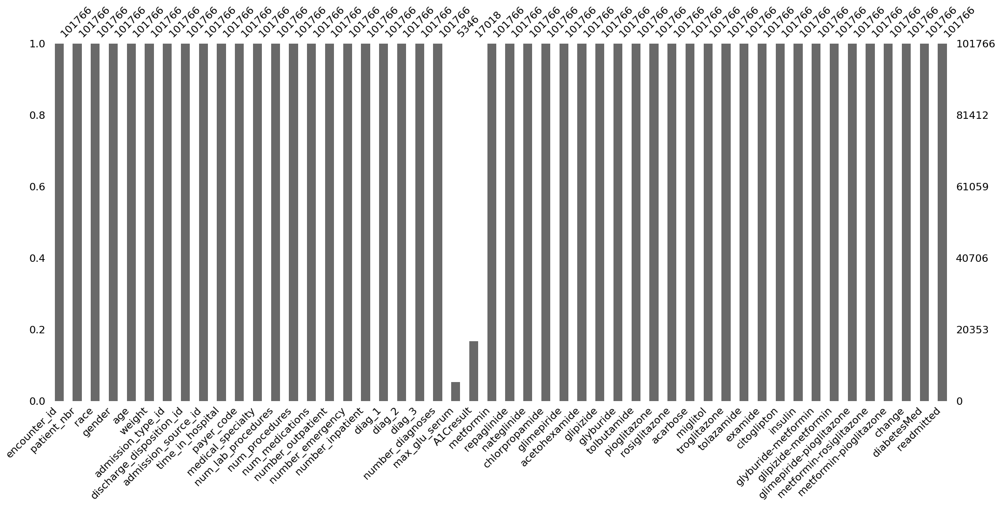

In [ ]:
msno.bar(diabetes)

<Axes: >

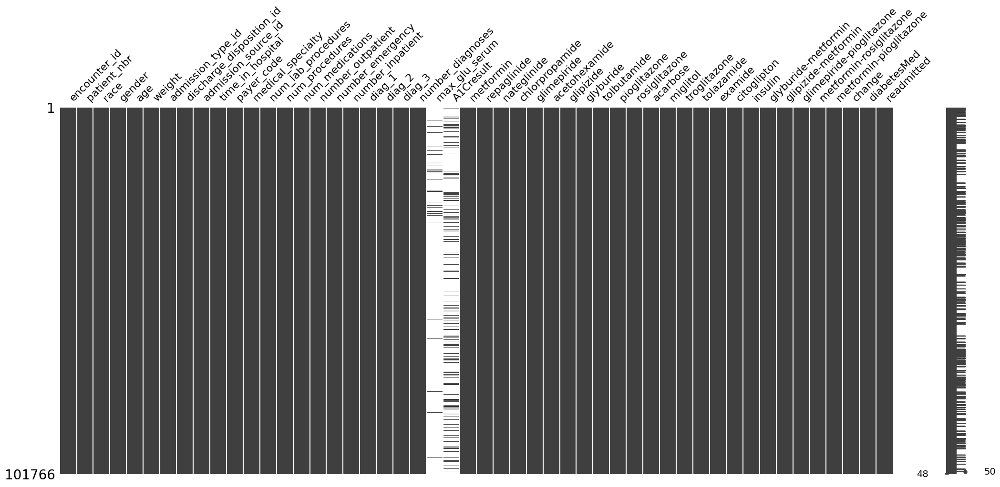

In [ ]:
msno.matrix(diabetes)

# Cleaning the data

Dropping the columns which are not required

In [ ]:
# Check if columns exist before dropping
columns_to_drop = ['encounter_id', 'patient_nbr', 'weight']
existing_columns = diabetes.columns

# Drop only the columns that exist in the DataFrame
columns_to_drop = [col for col in columns_to_drop if col in existing_columns]

# Drop the specified columns
diabetes = diabetes.drop(columns_to_drop, axis=1)

In [ ]:
# Removed the encounter_id and patient_nbr columns which aren't needed for analysis - could remove more
diabetes

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),6,25,1,1,?,Pediatrics-Endocrinology,41,...,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),1,1,7,3,?,?,59,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),1,1,7,2,?,?,11,...,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),1,1,7,2,?,?,44,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),1,1,7,1,?,?,51,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,Male,[70-80),1,3,7,3,MC,?,51,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,AfricanAmerican,Female,[80-90),1,4,5,5,MC,?,33,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,Caucasian,Male,[70-80),1,1,7,1,MC,?,53,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,Caucasian,Female,[80-90),2,3,7,10,MC,Surgery-General,45,...,No,Up,No,No,No,No,No,Ch,Yes,NO


Checking for duplicates

In [ ]:
diabetes.duplicated().sum()

0

Cleaning the missing data columns - with the help of AI

In [ ]:
from sklearn.impute import SimpleImputer

# Replace 'None' with 'NaN' if the data contain 'None'.
diabetes.replace('None', np.nan, inplace=True)
# Replace '>300' and 'Norm' and '<300' with numerical representations before imputation
diabetes['max_glu_serum'] = diabetes['max_glu_serum'].replace({'>300': 301, 'Norm': 150, 'None': np.nan ,'<300':299}) # Replace with appropriate values
diabetes['A1Cresult'] = diabetes['A1Cresult'].replace({'>8': 9, 'Norm': 6, 'None': np.nan,'>7': 8})  # Replace with appropriate values

# Convert columns to numeric type if they are not
diabetes['max_glu_serum'] = pd.to_numeric(diabetes['max_glu_serum'], errors='coerce')
diabetes['A1Cresult'] = pd.to_numeric(diabetes['A1Cresult'], errors='coerce')

imputer = SimpleImputer(strategy='median')

# Now impute with the numerical representations
diabetes[['max_glu_serum', 'A1Cresult']] = imputer.fit_transform(diabetes[['max_glu_serum', 'A1Cresult']])

<ipython-input-14-480e4c662415>:7: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  diabetes['A1Cresult'] = diabetes['A1Cresult'].replace({'>8': 9, 'Norm': 6, 'None': np.nan,'>7': 8})  # Replace with appropriate values


Checking if the changes took place

In [ ]:
diabetes['A1Cresult']

,A1Cresult
0,8.0
1,8.0
2,8.0
3,8.0
4,8.0
...,...
101761,9.0
101762,8.0
101763,8.0
101764,8.0


In [ ]:
diabetes['max_glu_serum']

,max_glu_serum
0,150.0
1,150.0
2,150.0
3,150.0
4,150.0
...,...
101761,150.0
101762,150.0
101763,150.0
101764,150.0


In [ ]:
missing(diabetes)

,Missing_Number,Missing_Percent
race,0,0.0
tolazamide,0,0.0
acetohexamide,0,0.0
glipizide,0,0.0
glyburide,0,0.0
tolbutamide,0,0.0
pioglitazone,0,0.0
rosiglitazone,0,0.0
acarbose,0,0.0
miglitol,0,0.0


<Axes: >

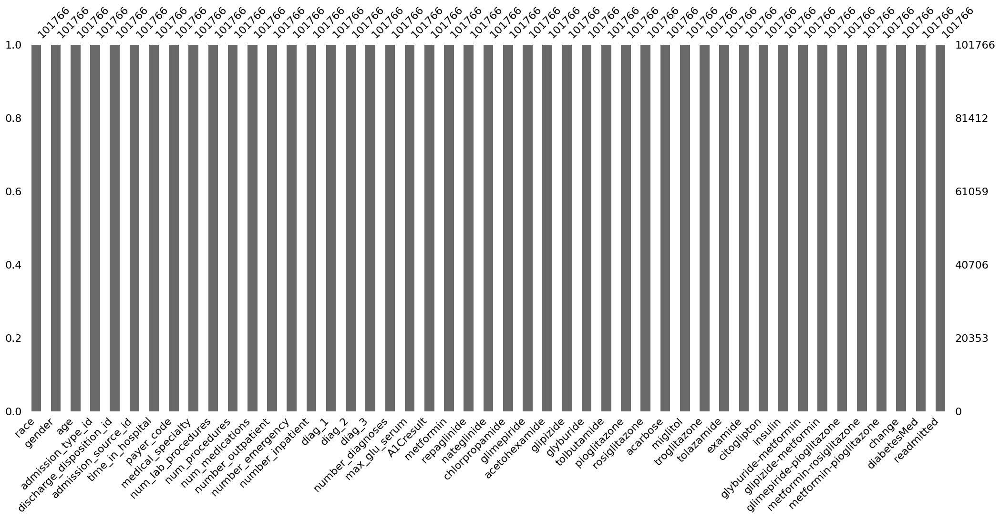

In [ ]:
# Now all columns are at their maximum
msno.bar(diabetes)

# Numerical data

In [ ]:
diabetes

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,num_lab_procedures,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,Female,[0-10),6,25,1,1,?,Pediatrics-Endocrinology,41,...,No,No,No,No,No,No,No,No,No,NO
1,Caucasian,Female,[10-20),1,1,7,3,?,?,59,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,AfricanAmerican,Female,[20-30),1,1,7,2,?,?,11,...,No,No,No,No,No,No,No,No,Yes,NO
3,Caucasian,Male,[30-40),1,1,7,2,?,?,44,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,Caucasian,Male,[40-50),1,1,7,1,?,?,51,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,Male,[70-80),1,3,7,3,MC,?,51,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,AfricanAmerican,Female,[80-90),1,4,5,5,MC,?,33,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,Caucasian,Male,[70-80),1,1,7,1,MC,?,53,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,Caucasian,Female,[80-90),2,3,7,10,MC,Surgery-General,45,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [ ]:
# Looking at the data type of the columns
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 47 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   race                      101766 non-null  object 
 1   gender                    101766 non-null  object 
 2   age                       101766 non-null  object 
 3   admission_type_id         101766 non-null  int64  
 4   discharge_disposition_id  101766 non-null  int64  
 5   admission_source_id       101766 non-null  int64  
 6   time_in_hospital          101766 non-null  int64  
 7   payer_code                101766 non-null  object 
 8   medical_specialty         101766 non-null  object 
 9   num_lab_procedures        101766 non-null  int64  
 10  num_procedures            101766 non-null  int64  
 11  num_medications           101766 non-null  int64  
 12  number_outpatient         101766 non-null  int64  
 13  number_emergency          101766 non-null  i

In [ ]:
# Naming numerical variables
numerical = ['admission_type_id', 'discharge_disposition_id', 'admission_source_id', 'time_in_hospital','num_lab_procedures','num_procedures', 'num_medications',
              'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses', 'max_glu_serum', 'A1Cresult' ]

In [ ]:
# Understanding our numerical variables
diabetes[numerical].describe()

,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,2.024006,3.715642,5.754437,4.395987,43.095641,1.339730,16.021844,0.369357,0.197836,0.635566,7.422607,151.875518,7.982666
std,1.445403,5.280166,4.064081,2.985108,19.674362,1.705807,8.127566,1.267265,0.930472,1.262863,1.933600,16.723889,0.525902
min,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,150.000000,6.000000
25%,1.000000,1.000000,1.000000,2.000000,31.000000,0.000000,10.000000,0.000000,0.000000,0.000000,6.000000,150.000000,8.000000
50%,1.000000,1.000000,7.000000,4.000000,44.000000,1.000000,15.000000,0.000000,0.000000,0.000000,8.000000,150.000000,8.000000
75%,3.000000,4.000000,7.000000,6.000000,57.000000,2.000000,20.000000,0.000000,0.000000,1.000000,9.000000,150.000000,8.000000
max,8.000000,28.000000,25.000000,14.000000,132.000000,6.000000,81.000000,42.000000,76.000000,21.000000,16.000000,301.000000,9.000000


### Skewness

In [ ]:
diabetes[numerical].skew()
# Positive numbers have a right tail skew - most values are on the left of the mean and most extreme values are on the right
# Negative ones have a left tail skewed shape

,0
admission_type_id,1.591984
discharge_disposition_id,2.563067
admission_source_id,1.029935
time_in_hospital,1.133999
num_lab_procedures,-0.236544
num_procedures,1.316415
num_medications,1.326672
number_outpatient,8.832959
number_emergency,22.855582
number_inpatient,3.614139


### Univariate Analysis

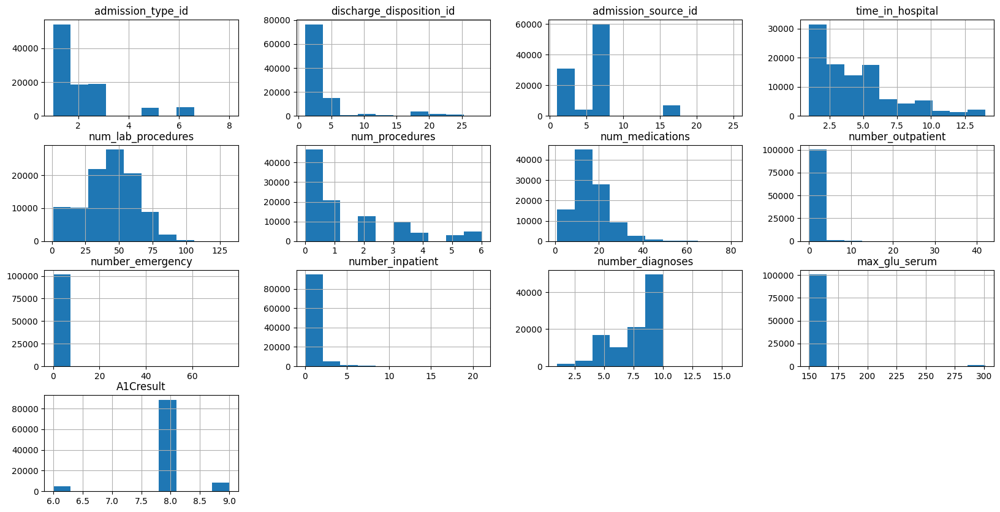

In [ ]:
diabetes[numerical].hist(figsize=(20,10));

In [ ]:
# Shows the distribution of patient stays in the hospital
fig = px.histogram(diabetes, x="time_in_hospital", title="Distribution of Time in Hospital")
fig.show()

* The majority of patients tend to have a shorter stay rather than long ones

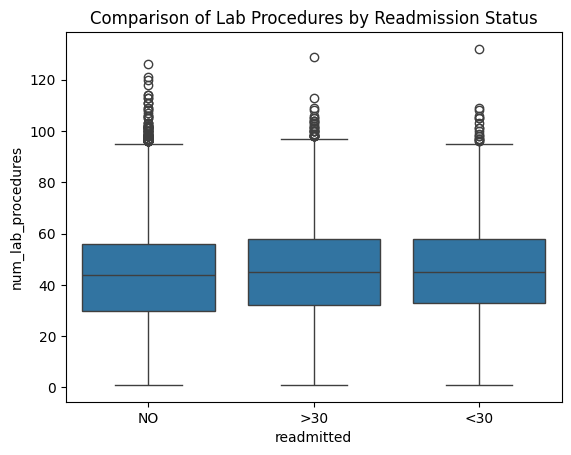

In [ ]:
# Compares the number of lab procedures for patients who were readmitted versus those who were not
sns.boxplot(x="readmitted", y="num_lab_procedures", data=diabetes)
plt.title("Comparison of Lab Procedures by Readmission Status")
plt.show()

* Patients that have more lab procedures done tend not to be readmitted compared to those that are >30 readmitted

In [ ]:
# Visualizes the potential correlation between the number of medications and the time spent in the hospital
fig = px.scatter(diabetes, x="num_medications", y="time_in_hospital",
                    title="Relationship Between Number of Medications and Hospital Stay Duration")
fig.show()

### Correlation Matrix

* Taking less medication shows a shorter stay at the hospital

In [ ]:
diabetes[numerical].corr()

,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult
admission_type_id,1.000000,0.083483,0.106654,-0.012500,-0.143713,0.129888,0.079535,0.026511,-0.019116,-0.038161,-0.117126,0.161111,0.028147
discharge_disposition_id,0.083483,1.000000,0.018193,0.162748,0.023415,0.015921,0.108753,-0.008715,-0.024471,0.020787,0.046891,0.018323,0.001236
admission_source_id,0.106654,0.018193,1.000000,-0.006965,0.048885,-0.135400,-0.054533,0.027244,0.059892,0.036314,0.072114,0.189045,0.008822
time_in_hospital,-0.012500,0.162748,-0.006965,1.000000,0.318450,0.191472,0.466135,-0.008916,-0.009681,0.073623,0.220186,0.037345,-0.014819
num_lab_procedures,-0.143713,0.023415,0.048885,0.318450,1.000000,0.058066,0.268161,-0.007602,-0.002279,0.039231,0.152773,-0.035905,-0.013023
num_procedures,0.129888,0.015921,-0.135400,0.191472,0.058066,1.000000,0.385767,-0.024819,-0.038179,-0.066236,0.073734,-0.034402,0.002205
num_medications,0.079535,0.108753,-0.054533,0.466135,0.268161,0.385767,1.000000,0.045197,0.013180,0.064194,0.261526,0.016510,-0.009680
number_outpatient,0.026511,-0.008715,0.027244,-0.008916,-0.007602,-0.024819,0.045197,1.000000,0.091459,0.107338,0.094152,0.022623,0.007941
number_emergency,-0.019116,-0.024471,0.059892,-0.009681,-0.002279,-0.038179,0.013180,0.091459,1.000000,0.266559,0.055539,0.031937,0.004177
number_inpatient,-0.038161,0.020787,0.036314,0.073623,0.039231,-0.066236,0.064194,0.107338,0.266559,1.000000,0.104710,0.035806,0.013511


In [ ]:
diabetes.groupby('diabetesMed')[numerical].mean()

,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,max_glu_serum,A1Cresult
diabetesMed,,,,,,,,,,,,,
No,2.024826,3.994744,5.743281,4.054480,41.903730,1.361022,13.242063,0.331197,0.153698,0.575482,7.347648,151.445285,7.926890
Yes,2.023761,3.632288,5.757768,4.497977,43.451603,1.333372,16.852022,0.380754,0.211018,0.653510,7.444993,152.004007,7.999324


# Categorical data

In [ ]:
# Naming categorical variables
categorical = ['race', 'gender', 'age', 'weight', 'payer_code', 'medical_specialty', 'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
               'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide', 'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol',
               'troglitazone', 'tolazamide', 'examide', 'citoglipton', 'insulin', 'glyburide-metformin','glipizide-metformin', 'glimepiride-pioglitazone',
               'metformin-rosiglitazone', 'metformin-pioglitazon', 'change', 'diabetesMed']

In [ ]:
# Graphing by gender
print (f'{round(diabetes["gender"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="gender", title='Gender', width=500, height=500)
fig.show()

gender
Female             53.76
Male               46.24
Unknown/Invalid     0.00
Name: proportion, dtype: float64




*   54.708K females
*   47.055K males
* Hover over the graph columns to see the counts



In [ ]:
# Graphing by race
print (f'{round(diabetes["race"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="race", title='Race', width=500, height=500)
fig.show()

race
Caucasian          74.78
AfricanAmerican    18.88
?                   2.23
Hispanic            2.00
Other               1.48
Asian               0.63
Name: proportion, dtype: float64




*   76.099K Caucasians
*   19.21K African-Americans
* 641 Asians
* 2037 Hispanics
* 3779 Other



In [ ]:
# Graphing by age
print (f'{round(diabetes["age"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="age", title='Age', width=500, height=500)
fig.show()

age
[70-80)     25.62
[60-70)     22.09
[50-60)     16.96
[80-90)     16.90
[40-50)      9.52
[30-40)      3.71
[90-100)     2.74
[20-30)      1.63
[10-20)      0.68
[0-10)       0.16
Name: proportion, dtype: float64




*   The largest group is [70-80)
* Interestingly age group [90-100) is one of the lowest groups



In [ ]:
# Graphing by diabetes medication (was anything prescribed?)
print (f'{round(diabetes["diabetesMed"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="diabetesMed", title='diabetesMed', width=500, height=500)
fig.show()

diabetesMed
Yes    77.0
No     23.0
Name: proportion, dtype: float64




*   Most patients were prescribed diabetes medication


In [ ]:
# Graphing by insulin
print (f'{round(diabetes["insulin"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="insulin", title='Insulin', width=500, height=500)
fig.show()

insulin
No        46.56
Steady    30.31
Down      12.01
Up        11.12
Name: proportion, dtype: float64


* Most patients did not have insuling prescribed
* The amount of patients having an insulin increase and increae are very similar

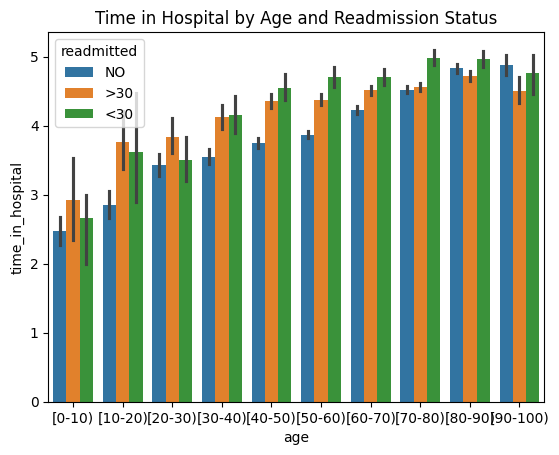

In [ ]:
# Compares the average time in the hospital for different age groups, further broken down by readmission status
# Uses numerical and categorical variables
sns.barplot(x="age", y="time_in_hospital", hue="readmitted", data=diabetes)
plt.title("Time in Hospital by Age and Readmission Status")
plt.show()



*   Younger folks have shorter stays at the hospital
*   Younger age groups [10-30] are readmitted after more than 30 days
* Older age groups [40-100] are readmitted less than 30 days




### Bivariate Analysis

In [ ]:
fig = px.histogram(diabetes, x="gender", color="diabetesMed",width=600, height=400)
fig.show()

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1992: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
fig = px.histogram(diabetes, x="race", color="diabetesMed",width=600, height=800)
fig.show()

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1992: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



In [ ]:
fig = px.histogram(diabetes, x="age", color="diabetesMed",width=800, height=600)
fig.show()

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1992: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



### Scatter plot

In [ ]:
fig = px.scatter(diabetes, x='race', y='age', color='readmitted',
                    title='Scatter Plot of Race vs. Age (Colored by Readmission Status)',
                    labels={'race': 'Race', 'age': 'Age Group', 'readmitted': 'Readmission Status'})
fig.show()

/usr/local/lib/python3.11/dist-packages/plotly/express/_core.py:1992: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.



# Insights

Numerical Data



* Most patients have shorter stays rather than longer ones, highlighting a right-skewed distribution
* Patients with more lab procedures tend not to be readmitted compared to those with fewer procedures and who are readmitted after more than 30 days. This suggests a potential relationship between the number of lab procedures and readmission
* Patients taking more medications tend to have longer hospital stays. This highlights a potential area for further investigation
* The correlation matrix provides a comprehensive overview of how numerical features relate to each other



Categorical Data



* There is a relatively balanced distribution between males and females
* A majority of patients were Caucasian, followed by African-American, and smaller proportions of other races
* The largest age group fell within the 70-80 age range
* Most patients were prescribed diabetes medication
* The scatter plot of 'race', 'age', and 'readmitted' showed the distribution of patients across different race and age categories, with color indicating their readmission status


In [ ]:
# Using get_dummies from the pandas library to convert categorical feature to numeric
diabetes = pd.get_dummies(diabetes, drop_first = False)

# Breaking the data up into Train & Test

In [ ]:
# Converts categorical variables into numerical ones (one-hot coding)
diabetes = pd.get_dummies(diabetes, drop_first = False).astype(int)

In [ ]:
train_df, valid_df, test_df = np.split(diabetes.sample(frac=1, random_state=42),
                                       [int(.7*len(diabetes)), int(0.85*len(diabetes))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

/usr/local/lib/python3.11/dist-packages/numpy/core/fromnumeric.py:59: FutureWarning: 'DataFrame.swapaxes' is deprecated and will be removed in a future version. Please use 'DataFrame.transpose' instead.
  return bound(*args, **kwds)


* This splits the dataset into three subsets and resets the indices for each subset
* diabetes.sample will shuffle the entire dataset
* np.split divides the shuffled dataset into three parts
* .reset_index resets the indices for each dataframe
* 70% -> training set
* 15% -> validation and test set


In [ ]:
readmitted_columns = [col for col in train_df.columns if col.startswith('readmitted_')]
for col in readmitted_columns:
    print(f"Value counts for {col}:\n{train_df[col].value_counts()}\n")

Value counts for readmitted_<30:
readmitted_<30
0    63275
1     7961
Name: count, dtype: int64

Value counts for readmitted_>30:
readmitted_>30
0    46318
1    24918
Name: count, dtype: int64

Value counts for readmitted_NO:
readmitted_NO
1    38357
0    32879
Name: count, dtype: int64



In [ ]:
readmitted_columns = [col for col in valid_df.columns if col.startswith('readmitted_')]
for col in readmitted_columns:
    print(f"Value counts for {col}:\n{valid_df[col].value_counts()}\n")

Value counts for readmitted_<30:
readmitted_<30
0    13520
1     1745
Name: count, dtype: int64

Value counts for readmitted_>30:
readmitted_>30
0    10008
1     5257
Name: count, dtype: int64

Value counts for readmitted_NO:
readmitted_NO
1    8263
0    7002
Name: count, dtype: int64



In [ ]:
readmitted_columns = [col for col in test_df.columns if col.startswith('readmitted_')]
for col in readmitted_columns:
    print(f"Value counts for {col}:\n{test_df[col].value_counts()}\n")

Value counts for readmitted_<30:
readmitted_<30
0    13614
1     1651
Name: count, dtype: int64

Value counts for readmitted_>30:
readmitted_>30
0    9895
1    5370
Name: count, dtype: int64

Value counts for readmitted_NO:
readmitted_NO
1    8244
0    7021
Name: count, dtype: int64



*  The code first identifies the new columns created during one-hot encoding by searching for columns that start with 'readmitted_'
*  train/valid/test_df[col].value_counts() iterates through these columns and prints the value counts for each using

# Treating the Imbalance in the Data

In [ ]:
def calc_prevalence(y_actual):

    '''
    This function is to understand the ratio/distribution of the classes that we are going to predict for.

    Params:
    1. y_actual: The target feature

    Return:
    1. (sum(y_actual)/len(y_actual)): The ratio of the postive class in the complete data.
    '''

    return (sum(y_actual)/len(y_actual))

In [ ]:
# split the training data into positive and negative
rows_pos = train_df['readmitted_<30'] == 1  # Access using bracket notation and correct column name
df_train_pos = train_df.loc[rows_pos]
df_train_neg = train_df.loc[~rows_pos]

# merge the balanced data
diabetes_df_balanced = pd.concat([df_train_pos, df_train_neg.sample(n = len(df_train_pos), random_state = 111)],axis = 0)

# shuffle the order of training samples
diabetes_df_balanced = diabetes_df_balanced.sample(n = len(diabetes_df_balanced), random_state = 42).reset_index(drop = True)

# Access the correct column name for prevalence calculation
print('Train balanced prevalence(n = %d):%.3f'%(len(diabetes_df_balanced), \
                                                calc_prevalence(diabetes_df_balanced['readmitted_<30'].values)))

Train balanced prevalence(n = 15922):0.500


In [ ]:
diabetes_df_balanced['readmitted_<30'].value_counts()

,count
readmitted_<30,
1,7961
0,7961


In [ ]:
X_train = diabetes_df_balanced.drop('readmitted_<30',axis=1)
y_train = diabetes_df_balanced['readmitted_<30']
X_valid = valid_df.drop('readmitted_<30',axis=1)
y_valid = valid_df['readmitted_<30']
X_test = test_df.drop('readmitted_<30',axis=1)
y_test = test_df['readmitted_<30']

# Creating and Understanding Models

In [ ]:
def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual ==0)

def print_report(y_actual, y_pred, thresh = 0.5):

    '''
    This function calculates all the metrics to asses the machine learning models.

    Params:
    1. y_actual: The actual values for the target variable.
    2. y_pred: The predicted values for the target variable.
    3. thresh: The threshold for the probability to be considered as a positive class. Default value 0.5

    Return:
    1. AUC
    2. Accuracy
    3. Recall
    4. Precision
    5. Specificity
    '''

    auc = roc_auc_score(y_actual, y_pred)
    accuracy = accuracy_score(y_actual, (y_pred > thresh))
    recall = recall_score(y_actual, (y_pred > thresh))
    precision = precision_score(y_actual, (y_pred > thresh))
    specificity = calc_specificity(y_actual, y_pred, thresh)
    print('AUC:%.3f'%auc)
    print('accuracy:%.3f'%accuracy)
    print('recall:%.3f'%recall)
    print('precision:%.3f'%precision)
    print('specificity:%.3f'%specificity)
    print('prevalence:%.3f'%calc_prevalence(y_actual))
    print(' ')
    return auc, accuracy, recall, precision, specificity

## Linear and Logistic Regression

In [ ]:
lnr = LinearRegression()
lnr.fit(X_train, y_train)


y_valid_preds = lnr.predict(X_valid)

In [ ]:
y_valid_preds

array([ 2.47642284e-09, -4.37361258e-10, -6.30095820e-09, ...,
        1.07635190e-09, -3.55957286e-09,  7.20277937e-09])

In [ ]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)

/usr/local/lib/python3.11/dist-packages/scipy/optimize/_linesearch.py:313: LineSearchWarning: The line search algorithm did not converge
  alpha_star, phi_star, old_fval, derphi_star = scalar_search_wolfe2(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/optimize.py:100: LineSearchWarning: The line search algorithm did not converge
  ret = line_search_wolfe2(


KeyboardInterrupt: 

* A prevalence of 0.114 means that approximately 11.4% of the people in the dataset are being readmitted to the hospital within 30 days
* To be mindful of:
     * Imbalanced datasets (where one class is much more prevalent than the other), accuracy alone can be misleading
     * Although all metrics are excellent, there's a possibility of overfitting due to the imbalance
     * What I did produced a very low prevalence, so it might be beneficial to consider techniques like oversampling or undersampling to create a more balanced dataset, potentially improving your model's performance
     * While perfect scores are desirable, they should be interpreted cautiously. In real-world scenarios, achieving perfect performance across all metrics is rare
* Next steps:
     * Explore techniques like cross-validation, and potentially consider using a stratified sampling approach to maintain the class proportions during evaluation
     * External validation

## Decision Tree Analysis

In [ ]:
dc_clf = DecisionTreeClassifier(random_state=50, max_depth=5, min_samples_split=5, min_samples_leaf=2)
# dc_clf creates a decision tree classifier
# random_state ensures consistent results across runs
# max_depth limits the tree's depth to n to avoid overfitting

dc_clf.fit(X_train, y_train)
# The model is trained using the training data (X_train, y_train)

dc_preds_proba = dc_clf.predict_proba(X_valid)[:,1]
dc_preds = dc_clf.predict(X_valid)
# Predictions are made on the validation data (X_valid)
# predict_proba gives probabilities for each class (readmitted or not)
# predict gives the predicted class labels directly

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,dc_preds_proba, 0.5)
# Model performance is based on AUC, accuracy, recall, precision, specificity
# This compares the predictions (dc_preds_proba) with the actual values (y_valid).

AUC:1.000
accuracy:1.000
recall:1.000
precision:1.000
specificity:1.000
prevalence:0.112
 


* Outcome:
    * The decision tree model also achieved a near-perfect performance
    * This is unusual in real-world scenarios and may be the result of overfitting
    * According the Gemini, this may be because of
       1. Data leakage where some features used in the predicion are too closely related to the outcome or contain information that shouldn't be available in a real-world scenario
       2. Small validation set that may inflate performance metrics --> increased validation to 90% instead of 85% = only prevalence decreased from 0.114 to 0.112
       3. Model complexity because it may be too complex for the dataset --> lowered complexity with `max_depth`, `min_samples_split`, and `min_samples_leaf` = resulted in the same results regardless of number change

## KNN Model

In [ ]:
knn = KNeighborsClassifier(n_neighbors = 100)
knn.fit(X_train, y_train)

knn_preds = knn.predict_proba(X_valid)[:,1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

# Assuming print_report is defined elsewhere in your code
# lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
#     lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

AUC:0.537
accuracy:0.529
recall:0.534
precision:0.127
specificity:0.466
prevalence:0.114
 


## Stochastic Gradient Descent Model

In [ ]:
sgdc=SGDClassifier(loss = 'log_loss',alpha = 0.1,random_state = 42)
sgdc.fit(X_train, y_train)

sgd_preds = sgdc.predict_proba(X_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.500
accuracy:0.886
recall:0.000
precision:0.000
specificity:1.000
prevalence:0.114
 


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Random Forest

In [ ]:
rf_clf = RandomForestClassifier(random_state=111, max_depth = 6)

rf_clf.fit(X_train, y_train)

rf_preds = rf_clf.predict(X_valid)
rf_preds_proba = rf_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,rf_preds_proba, 0.5)

AUC:0.995
accuracy:0.972
recall:0.960
precision:0.821
specificity:0.973
prevalence:0.114
 


## Linear SVC

In [ ]:
lsvc_clf = LinearSVC(random_state=111)
lsvc_clf.fit(X_train, y_train)

lsvc_preds = lsvc_clf.decision_function(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,lsvc_preds, 0.5)

AUC:0.521
accuracy:0.886
recall:0.000
precision:0.000
specificity:1.000
prevalence:0.114
 


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


## Gradient Boosting Model

In [ ]:
gb_clf = GradientBoostingClassifier(n_estimators = 100, criterion='friedman_mse', learning_rate = 1.0, max_depth = 3,\
                                    random_state = 111)

gb_clf.fit(X_train, y_train)
gb_preds = gb_clf.predict(X_valid)
gb_preds_proba = gb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,gb_preds_proba, 0.5)

AUC:1.000
accuracy:1.000
recall:1.000
precision:1.000
specificity:1.000
prevalence:0.114
 


## Catboost Model

In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

catb=CatBoostClassifier(iterations=200, depth=3, learning_rate=1.0, random_state = 111)
catb.fit(X_train, y_train)
catb_preds = catb.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,catb_preds, 0.5)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 10.4 MB/s eta 0:00:00
0:	learn: 0.0002413	total: 53ms	remaining: 10.6s
1:	learn: 0.0001469	total: 58.3ms	remaining: 5.77s
2:	learn: 0.0001469	total: 62.6ms	remaining: 4.11s
3:	learn: 0.0001469	total: 67.1ms	remaining: 3.29s
4:	learn: 0.0001469	total: 71.7ms	remaining: 2.8s
5:	learn: 0.0001469	total: 76.1ms	remaining: 2.46s
6:	learn: 0.0001469	total: 80.7ms	remaining: 2.22s
7:	learn: 0.0001469	total: 85ms	remaining: 2.04s
8:	learn: 0.0001469	total: 89.5ms	remaining: 1.9s
9:	learn: 0.0001469	total: 93.8ms	remaining: 1.78s
10:	learn: 0.0001469	total: 98.1ms	remaining: 1.69s
11:	learn: 0.0001469	total: 102ms	remaining: 1.6s
12:	learn: 0.0001469	total: 107ms	remaining: 1.53s
13:	learn: 0.0001469	total: 111ms	remaining: 1.48s
14:	learn: 0.0001469	total: 115ms	remaining: 1.42s
15:	learn: 0.0001469	total: 119ms	remaining: 1.37s
16:	learn: 0.0001469	total: 124ms	remaining: 1.33s
17:	learn: 0.0001469	total: 128ms	remaining: 1.29s
18:	learn